# NILM, SVM, DTW

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

# sharp plots with higher resolution
%config InlineBackend.figure_format = 'svg'
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 150

# UK-DALE data set for house number 4

In [2]:
# the original dataset from https://jack-kelly.com/data/
# warning: there are tricky gaps in the data; could be a good task for students
df1 = pd.read_csv('data/channel_1.dat', delimiter=' ', header=None, names=["date","aggregate"])
df2 = pd.read_csv('data/channel_2.dat', delimiter=' ', header=None, names=["date","entertainment"])
df3 = pd.read_csv('data/channel_3.dat', delimiter=' ', header=None, names=["date","kitchen_electronics"])
df4 = pd.read_csv('data/channel_4.dat', delimiter=' ', header=None, names=["date","gas_boiler"])
df5 = pd.read_csv('data/channel_5.dat', delimiter=' ', header=None, names=["date","freezer"])
df6 = pd.read_csv('data/channel_6.dat', delimiter=' ', header=None, names=["date","kitchen_appliances"])

In [3]:
# convert timestampt to date
df1['date'] = pd.to_datetime(df1['date'], unit='s')
df2['date'] = pd.to_datetime(df2['date'], unit='s')
df3['date'] = pd.to_datetime(df3['date'], unit='s')
df4['date'] = pd.to_datetime(df4['date'], unit='s')
df5['date'] = pd.to_datetime(df5['date'], unit='s')
df6['date'] = pd.to_datetime(df6['date'], unit='s')

In [4]:
# extract one month for the analysis from the dataset
fil_df1 = df1.loc[(df1['date'] >= '2013-04-01') & (df1['date'] <= '2013-04-30')]
fil_df2 = df2.loc[(df2['date'] >= '2013-04-01') & (df2['date'] <= '2013-04-30')]
fil_df3 = df3.loc[(df3['date'] >= '2013-04-01') & (df3['date'] <= '2013-04-30')]
fil_df4 = df4.loc[(df4['date'] >= '2013-04-01') & (df4['date'] <= '2013-04-30')]
fil_df5 = df5.loc[(df5['date'] >= '2013-04-01') & (df5['date'] <= '2013-04-30')]
fil_df6 = df6.loc[(df6['date'] >= '2013-04-01') & (df6['date'] <= '2013-04-30')]

In [5]:
# resample each dataset from 6 sec into 1 min intervals
res_df1 = fil_df1.resample('1T', on='date').mean()
res_df2 = fil_df2.resample('1T', on='date').mean()
res_df3 = fil_df3.resample('1T', on='date').mean()
res_df4 = fil_df4.resample('1T', on='date').mean()
res_df5 = fil_df5.resample('1T', on='date').mean()
res_df6 = fil_df6.resample('1T', on='date').mean()

In [6]:
# reset indices and do not add extra date columns
res_df1.reset_index(inplace=True)
res_df2.reset_index(inplace=True,drop=True)
res_df3.reset_index(inplace=True,drop=True)
res_df4.reset_index(inplace=True,drop=True)
res_df5.reset_index(inplace=True,drop=True)
res_df6.reset_index(inplace=True,drop=True)

In [7]:
# replace NaN elements with minimum elements across array; NaNs appear due to the gaps in dataset
fill_res_df1 = res_df1.fillna(res_df1.min())
fill_res_df2 = res_df2.fillna(res_df2.min())
fill_res_df3 = res_df3.fillna(res_df3.min())
fill_res_df4 = res_df4.fillna(res_df4.min())
fill_res_df5 = res_df5.fillna(res_df5.min())
fill_res_df6 = res_df6.fillna(res_df6.min())

In [8]:
# combine all the channels together
comb_df = pd.concat([fill_res_df1, fill_res_df2, fill_res_df3, fill_res_df4, fill_res_df5, fill_res_df6], axis=1)

In [9]:
# save processed data for the next lecture
comb_df.to_csv('data/processed_data.csv', index=False, sep=';') 

## All signals together (one day)

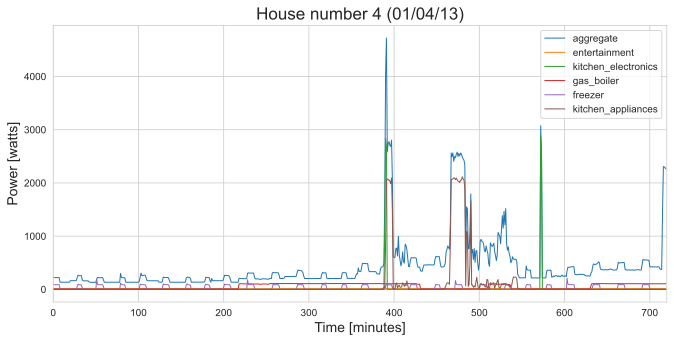

In [10]:
meters_list = ['aggregate', 'entertainment', 'kitchen_electronics', 'gas_boiler', 'freezer', 'kitchen_appliances']

fig = plt.figure(figsize=(11, 5))
for meter in meters_list:
    plt.plot(comb_df[meter].iloc[:720], label=meter, lw=1)
plt.title('House number 4 (01/04/13)', fontsize=17)
plt.xlabel('Time [minutes]', fontsize=14)
plt.xticks(fontsize=10)
plt.xlim(0,720)
plt.ylabel('Power [watts]', fontsize=14)
plt.yticks(fontsize=10)
plt.legend()
plt.show()
fig.savefig("NILM_aggregate.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

## Selected signals: freezer, kitchen electronics, gas boiler

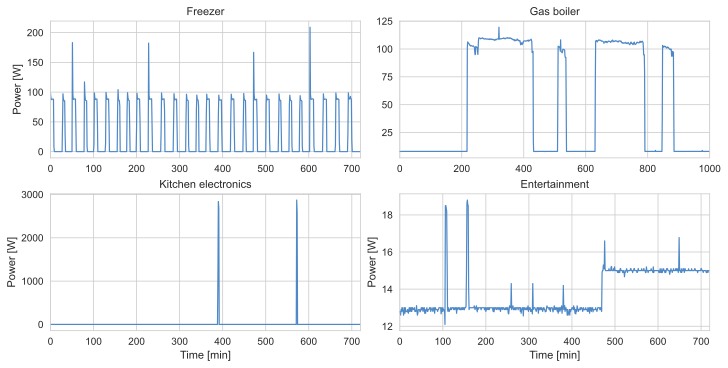

In [11]:
#fig = plt.figure(figsize=(8, 5))
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5), constrained_layout=True)

plt.subplot(2, 2, 1)
plt.plot(comb_df['freezer'].iloc[:720], lw=1.2, color='#4e88c7')
plt.ylabel('Power [W]', fontsize=11)
plt.xlim(0,720)
plt.title('Freezer', fontsize=11)

plt.subplot(2, 2, 2)
plt.plot(comb_df['gas_boiler'].iloc[:1000], lw=1.2, color='#4e88c7')
plt.xlim(0,1000)
plt.title('Gas boiler', fontsize=11)

plt.subplot(2, 2, 3)
plt.plot(comb_df['kitchen_electronics'].iloc[:720], lw=1.2, color='#4e88c7')
plt.xlabel('Time [min]', fontsize=11)
plt.ylabel('Power [W]', fontsize=11)
plt.xlim(0,720)
plt.title('Kitchen electronics', fontsize=11)

plt.subplot(2, 2, 4)
plt.plot(comb_df['entertainment'].iloc[:720], lw=1.2, color='#4e88c7')
plt.xlabel('Time [min]', fontsize=11)
plt.ylabel('Power [W]', fontsize=11)
plt.xlim(0,720)
plt.title('Entertainment', fontsize=11)

plt.show()
fig.savefig("subs.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

# Heuristic classification "by hand"

## Simple binary (1D or {-1,+1}) classification using power as a feature

In [12]:
# remove low power noise, anything below 10W; can be changed if needed
data_F = comb_df['freezer'].to_numpy()
data_KE = comb_df['kitchen_electronics'].to_numpy()
data_KA = comb_df['kitchen_appliances'].to_numpy()
data_GB = comb_df['gas_boiler'].to_numpy()
data_E = comb_df['entertainment'].to_numpy()

data_F_filt = data_F[data_F > 10]
data_KE_filt = data_KE[data_KE > 10]
data_KA_filt = data_KA[data_KA > 10]
data_GB_filt = data_GB[data_GB > 10]
data_E_filt = data_E[data_E > 10]

In [13]:
# easy case: gas boiler vs entertainment
fig = plt.figure(figsize=(7,5))
plt.scatter(data_GB_filt, np.ones(data_GB_filt.shape[0]), color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(data_E_filt, -1*np.ones(data_E_filt.shape[0]), color='#ed1b34', edgecolors='k', linewidths=0.4);
plt.xlabel('Power [W]', fontsize=11)
plt.ylabel('Class', fontsize=11)
plt.ylim(-2,2)
plt.legend(['gas boiler', 'entertainment'])
ax = plt.gca()
ax.set_yticks([-1,0,1])
plt.show()
#fig.savefig("1D_F-KE.png", format="png", bbox_inches="tight",pad_inches=0)

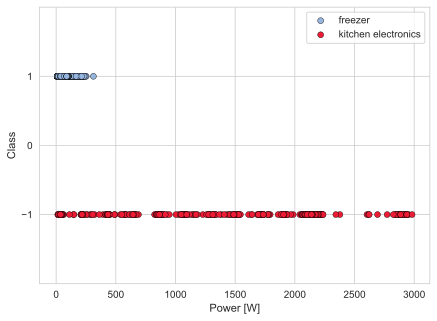

In [14]:
# easy case: freezer vs kitchen electronics
fig = plt.figure(figsize=(7,5))
plt.scatter(data_F_filt, np.ones(data_F_filt.shape[0]), color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(data_KE_filt, -1*np.ones(data_KE_filt.shape[0]), color='#ed1b34', edgecolors='k', linewidths=0.4);
plt.xlabel('Power [W]', fontsize=11)
plt.ylabel('Class', fontsize=11)
plt.ylim(-2,2)
plt.legend(['freezer', 'kitchen electronics'])
ax = plt.gca()
ax.set_yticks([-1,0,1])
plt.show()
fig.savefig("1D_F-KE.png", format="png", bbox_inches="tight",pad_inches=0)

In [15]:
# calculating ration between elements in 1 and -1 classes
data_F_filt.shape[0]

14924

In [16]:
data_KE_filt.shape[0]

324

In [17]:
data_KE_filt[data_KE_filt < data_F_filt.max()].shape[0]

38

In [18]:
# harder case: plot freezer vs gas boiler
fig = plt.figure(figsize=(7,5))
plt.scatter(data_F_filt, np.ones(data_F_filt.shape[0]), color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(data_GB_filt, -1*np.ones(data_GB_filt.shape[0]), color='#ed1b34', edgecolors='k', linewidths=0.4);
plt.xlabel('Power [W]', fontsize=11)
plt.ylabel('Class', fontsize=11)
plt.ylim(-2,2)
plt.legend(['freezer', 'gas boiler'])
ax = plt.gca()
ax.set_yticks([-1,0,1])
plt.show()
fig.savefig("1D_F-GB.png", format="png", bbox_inches="tight",pad_inches=0)

In [19]:
# calculating ration between elements in 1 and -1 classes
data_F_filt.shape[0]

14924

In [20]:
data_GB_filt.shape[0]

12598

In [21]:
data_F_filt[data_F_filt < data_GB_filt.max()].shape[0]

14701

## Transformed averaged signals. New feature

In [22]:
# define a function that splits a signal into below/above treshold intervals
def slicing(inputArg1, inputArg2):
    finArr = []
    A = np.transpose(inputArg1)
    
    ne0 = np.where(A > inputArg2)[0]  # Nonzero Elements
    if ne0.size != 0:
        ix0 = np.unique(np.hstack((ne0[0], ne0[np.diff(np.hstack(([0], ne0))) > 1])))  # Non-Zero Segment Start Indices
    else:
        ix0 = np.array([], dtype=int)
    
    eq0 = np.where(A <= inputArg2)[0]  # Zero Elements
    if eq0.size != 0:
        ix1 = np.unique(np.hstack((eq0[0], eq0[np.diff(np.hstack(([0], eq0))) > 1])))  # Zero Segment Start Indices
    else:
        ix1 = np.array([], dtype=int)
        
    ixv = np.sort(np.hstack((ix0, ix1)))  # Consecutive Indices Vector
    
    for k1 in range(len(ixv)):
        if k1 != len(ixv) - 1:
            finArr.append([np.mean(A[ixv[k1]:ixv[k1 + 1]]), len(A[ixv[k1]:ixv[k1 + 1]])])
        else:
            finArr.append([np.mean(A[ixv[k1]:len(A)]), len(A[ixv[k1]:len(A)])])
    
    return np.array(finArr)

In [23]:
# generate sliced signals
faF = slicing(comb_df['freezer'].to_numpy(),10)
faGB = slicing(comb_df['gas_boiler'].to_numpy(),10)
faKE = slicing(comb_df['kitchen_electronics'].to_numpy(),10)
faKA = slicing(comb_df['kitchen_appliances'].to_numpy(),10)
faE = slicing(comb_df['entertainment'].to_numpy(),10)

In [24]:
# we have pairs (duration, average power over the interval)
# we construct new stairs signals; hardcoded for illustration purposes only;
# proper implementation could be a good HW task for students
avgF = np.hstack((faF[0][0] * np.ones(int(faF[0][1])), faF[1][0]*np.ones(int(faF[1][1]-1)),
                  faF[2][0] * np.ones(int(faF[2][1]+1)), faF[3][0]*np.ones(int(faF[3][1]-1)),
                  faF[4][0] * np.ones(int(faF[4][1]+1))))
avgGB = np.hstack((faGB[0][0] * np.ones(int(faGB[0][1]-1)), faGB[1][0]*np.ones(int(faGB[1][1]+1)),
                   faGB[2][0] * np.ones(int(faGB[2][1]-1)), faGB[3][0]*np.ones(int(faGB[3][1]+1)),
                  faGB[4][0] * np.ones(int(faGB[4][1]))))

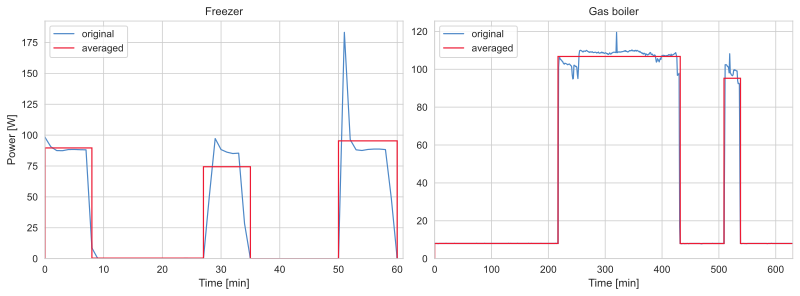

In [25]:
fig = plt.figure(figsize=(11, 4), constrained_layout=True)

plt.subplot(1, 2, 1)
plt.plot(comb_df['freezer'].iloc[:61], label='original', lw=1.2, color='#4e88c7')
plt.stairs(avgF, label='averaged', lw=1.2, color='#ed1b34', zorder=2)
plt.xlabel('Time [min]', fontsize=11)
plt.ylabel('Power [W]', fontsize=11)
plt.xlim(0,61)
plt.legend()
plt.title('Freezer', fontsize=11)

plt.subplot(1, 2, 2)
plt.plot(comb_df['gas_boiler'].iloc[:630], label='original', lw=1.2, color='#4e88c7')
plt.stairs(avgGB, label='averaged', lw=1.2, color='#ed1b34', zorder=2)
plt.xlabel('Time [min]', fontsize=11)
plt.xlim(0,630)
plt.legend()
plt.title('Gas boiler', fontsize=11)
plt.show()

fig.savefig("avg_sigs.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

In [26]:
# filtering out low power modes
faF_filt1 = faF[faF[:,0] > 10]
faF_filt = faF_filt1[faF_filt1[:,0] < 250] # we cut off one outlier, for illustration purpoces
faKE_filt = faKE[faKE[:,0] > 10]
faKA_filt = faKA[faKA[:,0] > 10]
faGB_filt = faGB[faGB[:,0] > 10]
faE_filt = faE[faE[:,0] > 10]

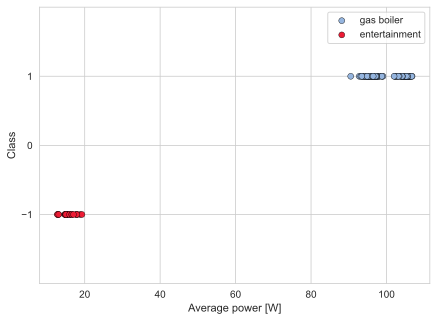

In [27]:
# Loss function illustration: gas boiler vs entertainment
fig = plt.figure(figsize=(7,5))
plt.scatter(faGB_filt[:,0], np.ones(faGB_filt[:,0].shape[0]), color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(faE_filt[:,0], -1*np.ones(faE_filt[:,0].shape[0]), color='#ed1b34', edgecolors='k', linewidths=0.4)
plt.xlabel('Average power [W]', fontsize=11)
plt.ylabel('Class', fontsize=11)
plt.ylim(-2,2)
plt.legend(['gas boiler', 'entertainment'])
ax = plt.gca()
ax.set_yticks([-1,0,1])
plt.show()
fig.savefig("1D_GB-E.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

## 2D classification using duration and power as features

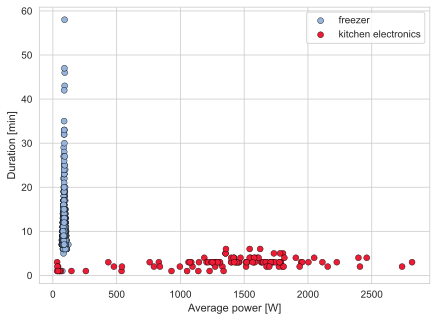

In [28]:
# freezer vs kitchen electronics
fig = plt.figure(figsize=(7,5))
plt.scatter(faF_filt[:,0], faF_filt[:,1], color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(faKE_filt[:,0], faKE_filt[:,1], color='#ed1b34', edgecolors='k', linewidths=0.4);
plt.xlabel('Average power [W]', fontsize=11)
plt.ylabel('Duration [min]', fontsize=11)
plt.legend(['freezer', 'kitchen electronics'])
plt.show()
fig.savefig("2D_F-KE.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

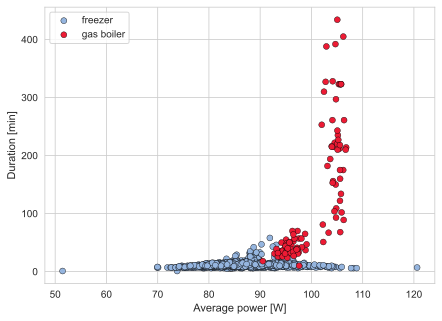

In [29]:
# freezer vs gas boiler
fig = plt.figure(figsize=(7,5))
plt.scatter(faF_filt[:,0], faF_filt[:,1], color='#95b5df', edgecolors='k', linewidths=0.4)
plt.scatter(faGB_filt[:,0], faGB_filt[:,1], color='#ed1b34', edgecolors='k', linewidths=0.4);
plt.xlabel('Average power [W]', fontsize=11)
plt.ylabel('Duration [min]', fontsize=11)
plt.legend(['freezer', 'gas boiler'], loc='upper left')
plt.show()
fig.savefig("2D_F-GB.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

# Classification with custom SVM

In [30]:
# custom SVM implementation
def svm_gd(X, y, alpha, iters, lam):
    m,n = X.shape
    theta = np.zeros(n)
    YX = X * y[:,None]
    loss, err = np.zeros(iters), np.zeros(iters)
    for t in range(iters):
        hy = YX @ theta
        loss[t] = np.maximum(1-hy,0).mean()
        err[t] = (hy <= 0).mean()
        theta -= alpha * (-YX.T @ (YX @ theta <= 1)/m + 2*lam*theta)
    return theta, loss, err

In [31]:
# min-max normalization to [0,1]
def normalize_data(X, normalize_cols):
    min_X = X[:,normalize_cols].min(axis=0)
    max_X = X[:,normalize_cols].max(axis=0)
    X[:,normalize_cols] = (X[:,normalize_cols] - min_X) / (max_X - min_X)
    return min_X, max_X

def unnormalize_theta(theta, normalize_cols, ranges):
    theta[normalize_cols] /= (ranges[1] - ranges[0])
    theta[-1] -= theta[normalize_cols] @ ranges[0]
    return theta

In [32]:
# build the data and run the SVM
fgb = np.vstack((faF_filt,faGB_filt))
X0 = np.hstack((fgb,np.ones((len(fgb),1))))
y0 = np.hstack((-1*np.ones(len(faF_filt)),np.ones(len(faGB_filt))))

X, y = X0.copy(), y0.copy()
ranges = normalize_data(X, [True, True, False])

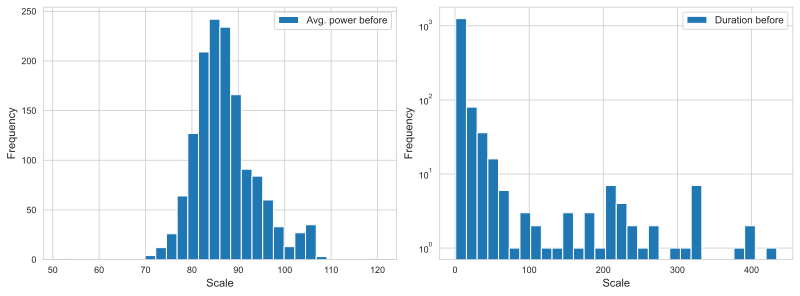

In [33]:
fig = plt.figure(figsize=(11, 4), constrained_layout=True)

plt.subplot(1, 2, 1)
plt.hist(X0[:,0], bins=30, label='Avg. power before')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.tick_params(labelsize=9)
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(X0[:,1], bins=30, label='Duration before')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.yscale('log', nonpositive='clip')
plt.tick_params(labelsize=9)
plt.legend()

plt.show()
fig.savefig("features_before.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

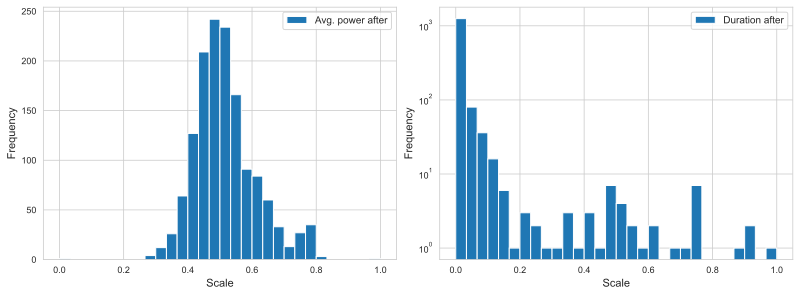

In [34]:
fig = plt.figure(figsize=(11, 4), constrained_layout=True)

plt.subplot(1, 2, 1)
plt.hist(X[:,0], bins=30, label='Avg. power after')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.tick_params(labelsize=9)
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(X[:,1], bins=30, label='Duration after')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.yscale('log', nonpositive='clip')
plt.tick_params(labelsize=9)
plt.legend()

plt.show()
fig.savefig("features_after.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

In [35]:
def plot_classification(theta):
    fig = plt.figure(figsize=(7,5))
    x_range = [0,140]
    y_range = [0,450]

# plot classifcation regions
    grid=200
    xx,yy = np.meshgrid(np.linspace(x_range[0], x_range[1], grid),
                        np.linspace(y_range[0], y_range[1], grid))
    X_ = np.array([np.ravel(xx), np.ravel(yy), np.ones(xx.size)]).T
    zz = (X_ @ theta).reshape(grid,grid)
    cs = plt.contourf(xx,yy,zz, zz,levels=[-100.0,0,100.0],alpha=0.2,colors=["#95b5df","#ed1b34"])
    plt.contour(cs, colors='k')

    s1 = plt.scatter(faF_filt[:,0], faF_filt[:,1], color='#95b5df', edgecolors='k', linewidths=0.4)
    s2 = plt.scatter(faGB_filt[:,0], faGB_filt[:,1], color='#ed1b34', edgecolors='k', linewidths=0.4)  
    plt.xlabel('Power [W]', fontsize=11)
    plt.ylabel('Duration [min]', fontsize=11)
    plt.xlim(0,140)
    plt.legend([s1,s2], ['freezer', 'gas boiler'], loc='upper left')
    return fig

[ 0.00661687  0.00411461 -1.74092309]


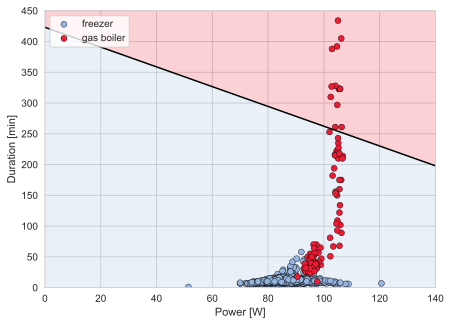

In [36]:
theta, loss, err = svm_gd(X,y, 1.0, 100, 1e-4)
fin = unnormalize_theta(theta, [True, True, False], ranges)
print(theta)
# final equation reads as: theta1*duration + theta2*power + theta3 = 0

fig = plot_classification(fin)
fig.savefig("custom_SVM1.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

[ 0.01341125  0.01418864 -2.4895429 ]


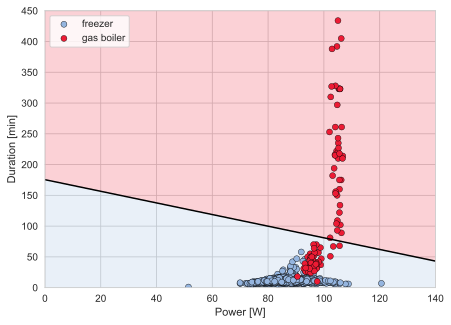

In [37]:
theta, loss, err = svm_gd(X,y, 1.0, 1000, 1e-4)
fin = unnormalize_theta(theta, [True, True, False], ranges)
print(theta)
# final equation reads as: theta1*duration + theta2*power + theta3 = 0

fig = plot_classification(fin)
fig.savefig("custom_SVM2.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

[ 0.01898995  0.0216045  -3.13148728]


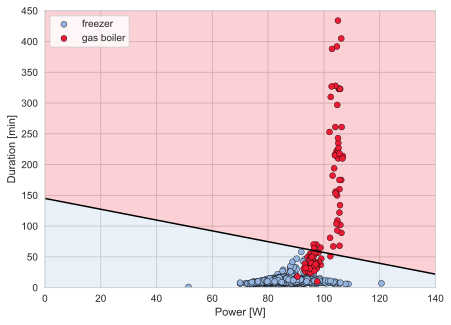

In [38]:
theta, loss, err = svm_gd(X,y, 1.0, 5000, 1e-4)
fin = unnormalize_theta(theta, [True, True, False], ranges)
print(theta)
# final equation reads as: theta1*duration + theta2*power + theta3 = 0

fig = plot_classification(fin)
fig.savefig("custom_SVM3.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

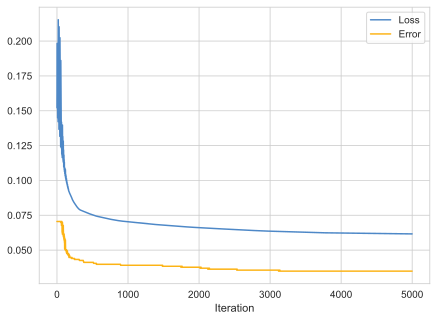

In [39]:
fig = plt.figure(figsize=(7,5))
plt.plot(loss[1:], lw=1.5, c='#4e88c7')
plt.plot(err[1:], lw=1.5, c='#fcb315')
plt.xlabel('Iteration', fontsize=11)
plt.legend(['Loss', 'Error'])
plt.show()
fig.savefig("custom_SVM_loss_err_norm01.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

In [40]:
# alternative scalers
# min-max normalization to [-1,1]
def normalize_data_2(X, normalize_cols):
    min_X = X[:,normalize_cols].min(axis=0)
    max_X = X[:,normalize_cols].max(axis=0)
    X[:,normalize_cols] = 2*(X[:,normalize_cols] - min_X) / (max_X - min_X) - 1
    return min_X, max_X

def unnormalize_theta_2(theta, normalize_cols, ranges):
    theta[-1] -= theta[normalize_cols].sum()
    theta[normalize_cols] *= 2/(ranges[1] - ranges[0])
    theta[-1] -= theta[normalize_cols] @ ranges[0]
    
# standartisation
def normalize_data_3(X, normalize_cols):
    mean_X = X[:,normalize_cols].mean(axis=0)
    std_X = X[:,normalize_cols].std(axis=0)
    X[:,normalize_cols] = (X[:,normalize_cols] - mean_X)/std_X
    return mean_X, std_X

def unnormalize_theta_3(theta, normalize_cols, mean_std):
    theta[normalize_cols] /= mean_std[1]
    theta[-1] -= theta[normalize_cols] @ mean_std[0]

[  0.08849501   0.09107364 -11.06814759]


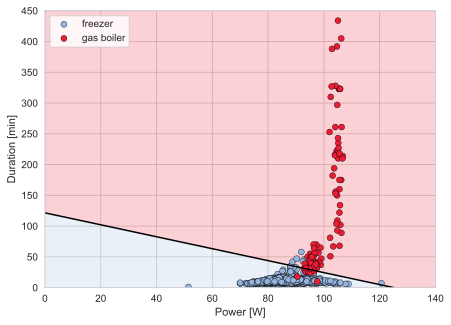

In [41]:
# build the data and run the SVM
X, y = X0.copy(), y0.copy()
mean_std = normalize_data_3(X, [True, True, False])
theta, loss, err = svm_gd(X,y, 1.0, 500, 1e-4)
fin = unnormalize_theta_3(theta, [True, True, False], mean_std)
print(theta)
# final equation reads as: theta1*duration + theta2*power + theta3 = 0

fig = plot_classification(theta)
fig.savefig("custom_SVM4.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

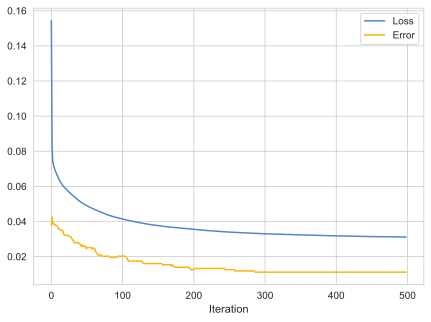

In [42]:
fig = plt.figure(figsize=(7,5))
plt.plot(loss[1:], lw=1.5, c='#4e88c7')
plt.plot(err[1:], lw=1.5, c='#fcb315')
plt.xlabel('Iteration', fontsize=11)
plt.legend(['Loss', 'Error'])
plt.show()
fig.savefig("custom_SVM_loss_err_normZ.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

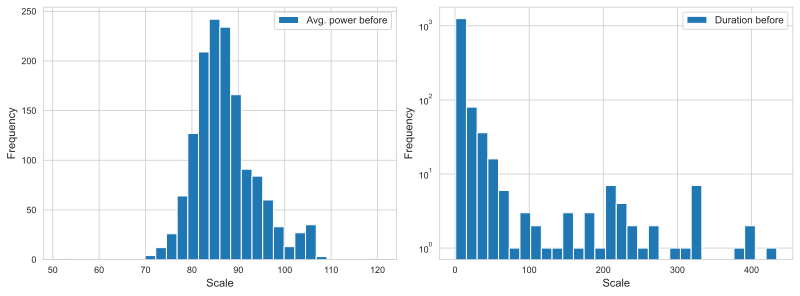

In [43]:
fig = plt.figure(figsize=(11, 4), constrained_layout=True)

plt.subplot(1, 2, 1)
plt.hist(X0[:,0], bins=30, label='Avg. power before')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.tick_params(labelsize=9)
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(X0[:,1], bins=30, label='Duration before')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.yscale('log', nonpositive='clip')
plt.tick_params(labelsize=9)
plt.legend()

plt.show()
fig.savefig("features_beforeZ.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

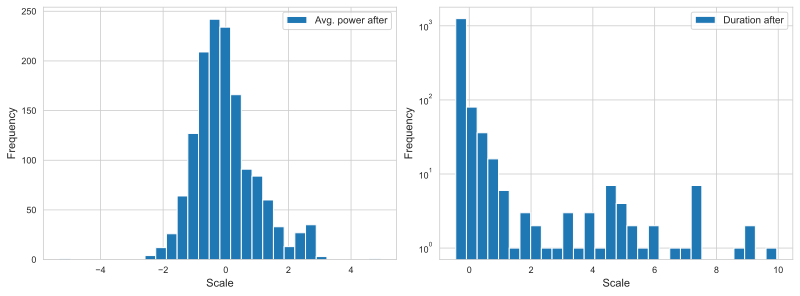

In [44]:
fig = plt.figure(figsize=(11, 4), constrained_layout=True)

plt.subplot(1, 2, 1)
plt.hist(X[:,0], bins=30, label='Avg. power after')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.tick_params(labelsize=9)
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(X[:,1], bins=30, label='Duration after')
plt.xlabel('Scale', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.yscale('log', nonpositive='clip')
plt.tick_params(labelsize=9)
plt.legend()

plt.show()
fig.savefig("features_afterZ.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

# Classification with scikit-learn

In [45]:
# For practice. Not covered during the lecture
from sklearn.preprocessing import StandardScaler

X,y = X0.copy()[:,:-1], y0.copy() # scikit learn doesn't require additional all-ones columns
norm = StandardScaler()
norm.fit(X)

StandardScaler()

In [46]:
from sklearn.svm import SVC

#clf = SVC(kernel='linear', C = 1/(2*1e-3*X.shape[0]))
#clf = SVC(kernel='rbf', C=10000, gamma=1e-03)
clf = SVC(kernel='poly', degree=3, coef0=10)
clf.fit(norm.fit_transform(X), y)

SVC(coef0=10, kernel='poly')

In [47]:
def plot_classification_sklearn(model, norm):
    fig = plt.figure(figsize=(7,5))
    x_range = [0,140]
    y_range = [0,450]

    # plot classifcation regions
    grid=200
    xx,yy = np.meshgrid(np.linspace(x_range[0], x_range[1], grid),
                        np.linspace(y_range[0], y_range[1], grid))
    X_ = np.array([np.ravel(xx), np.ravel(yy)]).T
    zz = model.decision_function(norm.transform(X_)).reshape(grid,grid)
    cs = plt.contourf(xx,yy,zz, zz,levels=[-float("inf"),0,float("inf")],alpha=0.2,colors=["#95b5df","#ed1b34"])
    plt.contour(cs, colors='k')

    s1 = plt.scatter(faF_filt[:,0], faF_filt[:,1], color='#95b5df', edgecolors='k', linewidths=0.4)
    s2 = plt.scatter(faGB_filt[:,0], faGB_filt[:,1], color='#ed1b34', edgecolors='k', linewidths=0.4)  
    plt.xlabel('Power [W]', fontsize=11)
    plt.ylabel('Duration [min]', fontsize=11)
    plt.xlim(0,140)
    plt.legend([s1,s2], ['freezer', 'gas boiler'], loc='upper left')
    return fig

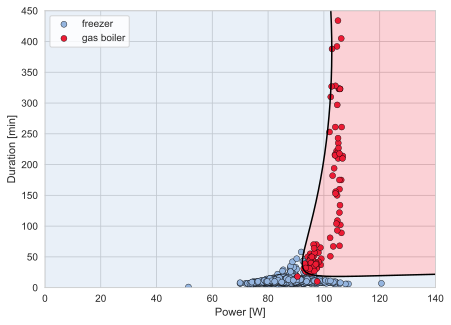

In [48]:
fig = plot_classification_sklearn(clf, norm)
fig.savefig("package_SVM.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

In [49]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
# again you can play with parameters to get better results
# criterion="entropy", max_depth=2, min_samples_leaf=4
clf.fit(X, y)

DecisionTreeClassifier()

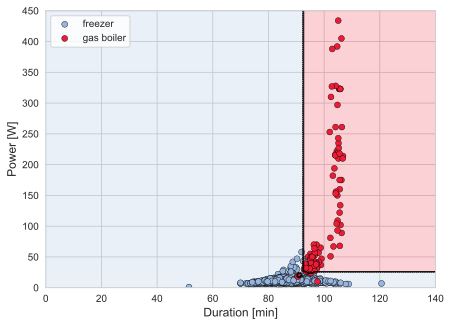

In [50]:
# note that we use predict function here, since DT does not have built-in decision_function()
# to plot decision boundary
fig = plt.figure(figsize=(7,5))
grid=200
xx,yy = np.meshgrid(np.linspace(0, 140, grid),np.linspace(0, 450, grid))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.2, colors=["#95b5df","#ed1b34"])
plt.contour(xx, yy, Z, colors='k', linewidths=0.4)
s1 = plt.scatter(faF_filt[:,0], faF_filt[:,1], color='#95b5df', edgecolors='k', linewidths=0.4)
s2 = plt.scatter(faGB_filt[:,0], faGB_filt[:,1], color='#ed1b34', edgecolors='k', linewidths=0.4)  
plt.xlabel('Duration [min]', fontsize=12)
plt.ylabel('Power [W]', fontsize=12)
plt.xlim(0,140)
plt.ylim(0,450)
plt.legend([s1,s2], ['freezer', 'gas boiler'], loc='upper left')
plt.show()
fig.savefig("package_SVM.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

# Miscellanious

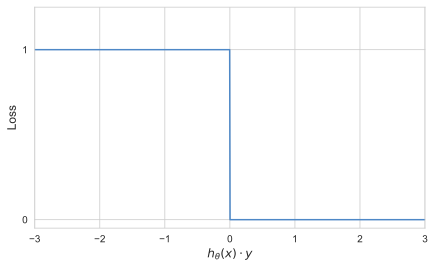

In [51]:
fig = plt.figure(figsize=(7,4))
hy = np.linspace(-3,3,1000)
plt.plot(hy,(hy<=0), color='#4e88c7')
plt.xlim([-3,3])
plt.ylim([-0.05, 1.25])
plt.ylabel("Loss", fontsize=12)
plt.xlabel("$h_θ(x) \cdot y$", fontsize=12)
ax = plt.gca()
ax.set_yticks([0,1])
plt.show()
fig.savefig("loss01.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

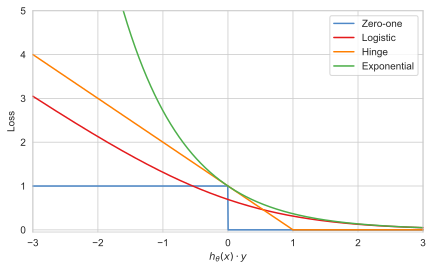

In [52]:
fig = plt.figure(figsize=(7,4))
hy = np.linspace(-3,3,1000)
plt.plot(hy,(hy<=0), color='#4e88c7')
plt.plot(hy, np.log(1+np.exp(-hy)), color='#e41a1c')
plt.plot(hy, np.maximum(1 - hy, 0), color='#ff7f00')
plt.plot(hy, np.exp(-hy), color='#4daf4a')
plt.xlim([-3,3])
plt.ylim([-0.05, 5])
plt.ylabel("Loss")
plt.xlabel("$h_θ(x) \cdot y$")
plt.legend(['Zero-one', 'Logistic', 'Hinge', 'Exponential'])
#ax = plt.gca()
#ax.set_yticks([0,1])
plt.show()
fig.savefig("losses.pdf", format="pdf", bbox_inches="tight",pad_inches=0)

# Dynamic Time Warping

In [53]:
# implementation of the DTW method
def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)


def dist_matrix(x,y):
    N = x.shape[0]
    M = y.shape[0]
    dist_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            dist_mat[i, j] = abs(x[i] - y[j])
    return dist_mat, N, M

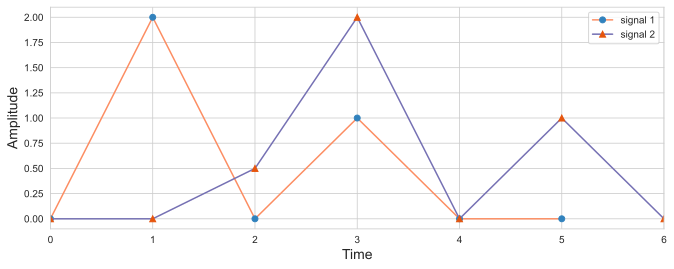

In [54]:
# consider an illustrative example with two simple signals
# our goal is to calculate similarity between two signals using DTW method
# point out that signals are similar up to a small shift
x1 = np.array([0,2,0,1,0,0])
x2 = np.array([0,0,0.5,2,0,1,0])


plt.figure(figsize=(11, 4))
plt.plot(x1, marker="o", mfc = '#3182BD', mec = '#3182BD', label='signal 1', color='#FC8D62')
plt.plot(x2, marker="^", mfc = '#E6550D', mec = '#E6550D', label='signal 2', color='#7570B3')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Amplitude', fontsize=14)
plt.xlim(0,6)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend()
plt.show()

In [55]:
# calculate cost matrix and warping path
dist_mat, N, M =  dist_matrix(x1,x2)
path, cost_mat = dp(dist_mat)

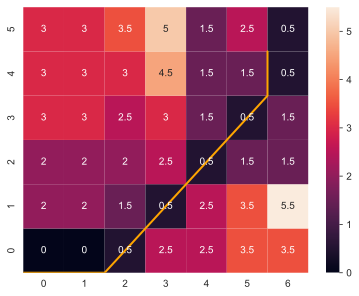

In [56]:
# visualize cost matrix and warping path
ax = sns.heatmap(cost_mat, annot=True) # add labels with cost values
ax.invert_yaxis()
x1_path, x2_path = zip(*path)
plt.plot(x2_path, x1_path, lw=2, c='orange')
plt.show()

In [57]:
print("Warping path coordinates: " + str(path))
# remind students that for the convenience of calculations in lectures we used auxilary column and row
# of infinite values

Warping path coordinates: [(0, 0), (0, 1), (0, 2), (1, 3), (2, 4), (3, 5), (4, 6), (5, 6)]


In [58]:
# sum over the selected indices in the list and calculate normalized distance
res_list = sum(cost_mat[i] for i in path)/len(path)
print("Normalized distance: " + str(res_list))

Normalized distance: 0.375


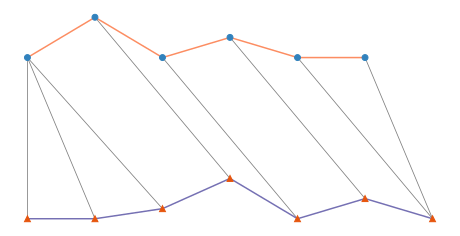

In [59]:
# visualize the normalized distance - weighted sum over grey lines
plt.figure(figsize=(8, 4))
for x1_i, x2_j in path:
    plt.plot([x1_i, x2_j], [x1[x1_i] + 4, x2[x2_j] - 4], c="C7", lw=0.8)
plt.plot(np.arange(x1.shape[0]), x1 + 4, marker="o", mfc = '#3182BD', mec = '#3182BD', label='signal 1', color='#FC8D62')
plt.plot(np.arange(x2.shape[0]), x2 - 4, marker="^", mfc = '#E6550D', mec = '#E6550D', label='signal 2', color='#7570B3')
plt.axis("off")
plt.show()